# 实验1
基于California Housing Prices数据集，完成关于房价预测的线性回归模型训练、测试与评估。

1. 准备数据集并认识数据
下载California Housing Prices数据集 https://www.kaggle.com/camnugent/california-housing-prices
了解数据集各个维度特征及预测值的含义


2. 探索数据并预处理数据
	观察数据集各个维度特征及预测值的数值类型与分布
	预处理各维度特征（如将类别型维度ocean_proximity转换为one-hot形式的数值数据），参考：https://blog.csdn.net/SanyHo/article/details/105304292
	划分70%的样本作为训练数据集，30%的样本作为测试数据集


3. 求解模型参数
	编程实现线性回归模型的闭合形式参数求解
	编程实现线性回归模型的梯度下降参数优化


4. 测试和评估模型
 	在测试数据集上计算所训练模型的$ R^2 $指标

--------------------------------------------------------------------------------------------
（1）简要介绍线性回归闭合形式参数求解的原理
（2）简要介绍线性回归梯度下降参数求解的原理
（3）程序清单（包含详细求解步骤）
（4）展示实验结果，比较两种求解方式的优劣
（5）讨论实验结果，分析各个特征与目标预测值的正负相关性

In [1]:
# 导入所需的包
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
import time

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

## 1.读取数据集

In [2]:
# 读取数据
df = pd.read_csv("./housing.csv")
# 预览数据
print(df.head())

   longitude  latitude  housing_median_age  total_rooms  total_bedrooms  \
0    -122.23     37.88                41.0        880.0           129.0   
1    -122.22     37.86                21.0       7099.0          1106.0   
2    -122.24     37.85                52.0       1467.0           190.0   
3    -122.25     37.85                52.0       1274.0           235.0   
4    -122.25     37.85                52.0       1627.0           280.0   

   population  households  median_income  median_house_value ocean_proximity  
0       322.0       126.0         8.3252            452600.0        NEAR BAY  
1      2401.0      1138.0         8.3014            358500.0        NEAR BAY  
2       496.0       177.0         7.2574            352100.0        NEAR BAY  
3       558.0       219.0         5.6431            341300.0        NEAR BAY  
4       565.0       259.0         3.8462            342200.0        NEAR BAY  


In [3]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB
None


**各个维度信息如下：**

| 属性                | 描述             |
|---------------------|------------------|
| longitude latitude  | 坐标             |
| housing_median_age  | 房龄             |
| total_rooms         | 总房间数量       |
| total_bedrooms      | 总卧室数量       |
| population          | 人口             |
| households          | 家庭户数         |
| median_income       | 收入中位数       |
| median_house_value  | 房价中位数       |
| ocean_proximity     | 距离海边的距离   |

**ocean_proximity 类别:**
- INLAND: 内地，内陆
- NEAR OCEAN: 靠海
- NEAR BAY: 靠海湾
- ISLAND: 岛上

-------------------------------------------
**其余发现：**
- 发现total_bedrooms属性有缺失值，，其余没有
- ocean_proximity为分类属性，其余数值属性

-------------------------------------------
**任务：**
通过各个维度的数据来预测房价中位数

## 2.数据探索

### 1）查看数据的分布情况

In [4]:
i = 2
fig, ax = plt.subplots(3, 3, figsize=(18, 18))

# 散点图看看价格/房子分布
sns.scatterplot(data=df, x="longitude", y="latitude", size="median_house_value", hue="median_house_value", ax=ax[0][0])

# 直方图，正态否？
for col in df.columns:
    if col == "longitude" or col == "latitude" or col == "ocean_proximity":
        continue
    sns.histplot(data=df[col], bins=60, kde=True, ax=ax[(i - 1) // 3][(i - 1) % 3])
    i = i + 1

# 分类变量
sns.countplot(data=df,x="ocean_proximity",ax=ax[2][2])

<Axes: xlabel='ocean_proximity', ylabel='count'>

### 2）研究数据之间的关系

#### 距海远近 VS 房龄


从上图可以发现房龄呈现明显双峰或多峰的情况，针对房龄进行进一步分析，查看不同ocean_proximity下房龄的区别

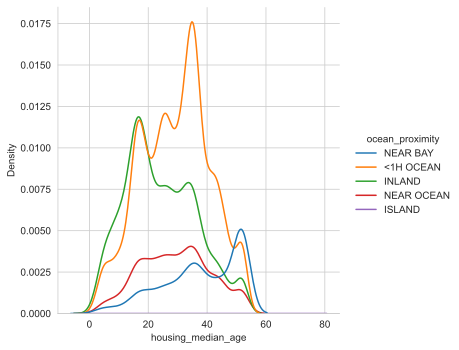

In [5]:
sns.displot(data=df,x="housing_median_age",hue="ocean_proximity",kind="kde")

在不同ocean_proximity类别下，房龄的分布具有显著的差异，可以看到：
- NEAR BAY 房龄主要分布在50（主峰）或 35（次峰）
- <1H OCEAN 房龄主要分布在37（主峰） 17（次） 25（次）
- INLAND 房龄主要分布在17（主峰）或 30（次峰）
- NEAR OCEAN 房龄分布较为广泛 主要位于17 - 35
- ISLAND 数据较少，无参考价值

看看不同类别的房子 **房龄** 区别，这里用描述性统计看看

In [6]:
# housing_median_age描述性统计
df.groupby('ocean_proximity')['housing_median_age'].describe()

,count,mean,std,min,25%,50%,75%,max
ocean_proximity,,,,,,,,
<1H OCEAN,9136.0,29.279225,11.644453,2.0,20.0,30.0,37.0,52.0
INLAND,6551.0,24.271867,12.018020,1.0,15.0,23.0,33.0,52.0
ISLAND,5.0,42.400000,13.164346,27.0,29.0,52.0,52.0,52.0
NEAR BAY,2290.0,37.730131,13.070385,2.0,29.0,39.0,52.0,52.0
NEAR OCEAN,2658.0,29.347254,11.840371,2.0,20.0,29.0,37.0,52.0


从上图可以也发现价格有多峰的的情况，查看不同ocean_proximity下价格的区别

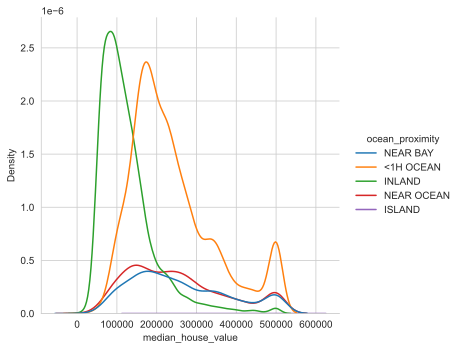

In [7]:
sns.displot(data=df,x="median_house_value",hue="ocean_proximity",kind="kde")

#### 距海远近 VS 价格

看看不同类别的房子 **价格** 区别，这里用描述性统计看看

In [8]:
# median_house_value描述性统计
df.groupby('ocean_proximity')['median_house_value'].describe()

,count,mean,std,min,25%,50%,75%,max
ocean_proximity,,,,,,,,
<1H OCEAN,9136.0,240084.285464,106124.292213,17500.0,164100.0,214850.0,289100.0,500001.0
INLAND,6551.0,124805.392001,70007.908494,14999.0,77500.0,108500.0,148950.0,500001.0
ISLAND,5.0,380440.000000,80559.561816,287500.0,300000.0,414700.0,450000.0,450000.0
NEAR BAY,2290.0,259212.311790,122818.537064,22500.0,162500.0,233800.0,345700.0,500001.0
NEAR OCEAN,2658.0,249433.977427,122477.145927,22500.0,150000.0,229450.0,322750.0,500001.0


#### 连续型 VS 连续型

In [9]:
# sns.pairplot(data=df.select_dtypes(include='float64'), kind='reg', diag_kind='hist')
# plt.savefig("1.png")

In [3]:
# 计算变量之间的相关系数,皮尔逊相关系数展示线性相关关系
df_corr = df.select_dtypes(include='float64').corr()
df_corr

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.000000,-0.924664,-0.108197,0.044568,0.069608,0.099773,0.055310,-0.015176,-0.045967
latitude,-0.924664,1.000000,0.011173,-0.036100,-0.066983,-0.108785,-0.071035,-0.079809,-0.144160
housing_median_age,-0.108197,0.011173,1.000000,-0.361262,-0.320451,-0.296244,-0.302916,-0.119034,0.105623
total_rooms,0.044568,-0.036100,-0.361262,1.000000,0.930380,0.857126,0.918484,0.198050,0.134153
total_bedrooms,0.069608,-0.066983,-0.320451,0.930380,1.000000,0.877747,0.979728,-0.007723,0.049686
population,0.099773,-0.108785,-0.296244,0.857126,0.877747,1.000000,0.907222,0.004834,-0.024650
households,0.055310,-0.071035,-0.302916,0.918484,0.979728,0.907222,1.000000,0.013033,0.065843
median_income,-0.015176,-0.079809,-0.119034,0.198050,-0.007723,0.004834,0.013033,1.000000,0.688075
median_house_value,-0.045967,-0.144160,0.105623,0.134153,0.049686,-0.024650,0.065843,0.688075,1.000000


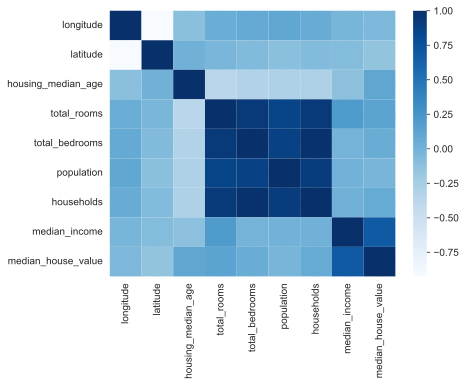

In [4]:
# 绘制热力图
sns.heatmap(df_corr, cmap="Blues")
plt.savefig("2.png",dpi=800)

## 3.数据预处理

### 1）处理缺失值

中位数填补

In [ ]:
# 取出有缺失值的列
total_bedrooms = df.loc[:, "total_bedrooms"].values.reshape(-1, 1)  # reshape是为了适应sklearn要求

# 放回
filled_df = df.copy()  # 复制一份不破坏原数据
filled_df.loc[:, "total_bedrooms"] = SimpleImputer(strategy="median").fit_transform(total_bedrooms)  # 中位数填补
# 看一下效果
filled_df.info()

### 2）编码

对类别类型变量ocean_proximity进行编码

网络查询得到采用的编码方式有以下：
- 独热编码
![](https://pic1.zhimg.com/80/v2-38195089c20cee9afa96fe88610cdbe0_720w.webp)
对于一个有许多类别或层次的分类特征，从机器学习的角度来看独热编码不是一个很好的选择，最明显的原因是它加起来有大量的维度。例如，pin码有大量的级别或类别。创建一个单热编码的向量的Pincode列将使所有的值加起来都为零，只有1列除外。这个数字向量包含的信息不多，只有一大堆0。


- 频率编码
频率编码是Kaggle比赛中大量使用的一种技术或技巧。 想法是用其计数或频率替换每个类别。
![](https://pic1.zhimg.com/80/v2-2610a06381e7ac9eaeed07a131dfc028_720w.webp)

- 标签编码(Label Encoding)
标签编码为每一个不同的类别值赋上不同的整数值。而且这个方法为这些类别假定一个顺序，若下列例子所示：“Never”(0)<“Rarely”(1)<“Most days(2)”<“Every day”(3)。
当然，并不是所有的类别变量都有一个明确的顺序。如果有的话，我们则称那些正数为序级变量（ordinal variables）。在那些基于树形结构的模型（如决策树和随机森林），标签编码得到的序级变量工作很好。
![](https://img-blog.csdnimg.cn/20200404002753391.png?x-oss-process=image/watermark,type_ZmFuZ3poZW5naGVpdGk,shadow_10,text_aHR0cHM6Ly9ibG9nLmNzZG4ubmV0L1NhbnlIbw==,size_16,color_FFFFFF,t_70)


**采用独热编码**

In [ ]:
# 编码
code = OneHotEncoder().fit_transform(filled_df.loc[:, "ocean_proximity"].values.reshape(-1, 1))

# 合并
coded_df = pd.concat([filled_df, pd.DataFrame(code.toarray())], axis=1)

# 删除原列
coded_df.drop(["ocean_proximity"], axis=1, inplace=True)

# 改下表头
coded_df.columns = list(coded_df.columns[:-5]) + ["ocean_0", "ocean_1", "ocean_2", "ocean_3", "ocean_4"]
# coded_df.columns = coded_df.columns.astype(str)

# 看看效果
coded_df.head(10)

### 3）划分训练集、测试集7：3


In [ ]:
feature = coded_df.iloc[:, :8].join(coded_df.iloc[:, -5:])
label = coded_df["median_house_value"]

Xtrain,Xtest,Ytrain,Ytest = train_test_split(feature,label,test_size=0.3)

Xtrain.head()

## 4.求解模型参数

### 0）数据标准化

In [ ]:
# 数据标准化
def normalize(X):
    sigma = np.std(X, axis=0)
    mu = np.mean(X, axis=0)
    X = (X - mu) / sigma
    return np.array(X)


X = np.array(Xtrain).reshape(np.size(Xtrain, 0), -1)
y = np.array(Ytrain).T.reshape(-1, 1)

# 归一化（闭式求解其实不需要，但梯度下降需要，为了对比统一都采用归一化）
X = normalize(X)
y = normalize(y)

$$
R^{2}=\frac{SSR}{SST}
$$

SST是因变量观测值和均值之间的差异的偏差平方和，SSR是回归平方和，是由变量x引起的偏差

In [ ]:
# 计算R^2
def R2(y, y_pred):
    return 1 - (np.sum((y - y_pred) ** 2) / np.sum((y - np.mean(y)) ** 2))

### 1）线性回归模型的闭合形式参数求解

![](https://pic2.zhimg.com/80/v2-f2402d8c6df252bed9b4730393fc385d_720w.webp)

In [ ]:
# 正规方程求解
def Normal_Equation(X, y):
    return np.linalg.inv(X.T @ X) @ X.T @ y


start_time = time.time()
theta_ne = Normal_Equation(X, y)

print(f"花费时间：{time.time() - start_time}")
print(f"R^2：{R2(y, X @ theta_ne)}")

# 创建 DataFrame
result_cf = pd.DataFrame({"ColumnName": list(Xtrain.columns), "Theta": theta_ne.flatten()})
result_cf

### 2）线性回归梯度下降参数求解

数据归一化对于梯度下降算法的优化非常重要。原因在于，梯度下降法是基于特征空间进行迭代的，不同尺度的特征会导致特征空间中的尺度也不一致，使得搜索过程中可能需要在某些方向上进行大幅度的移动，而在其他方向上只需要进行小幅度的移动。

"特征尺度"是指特征值的取值范围或者说是分布的规模。例如，一个特征可能是人的年龄，范围在0-100之间；另一个特征可能是人的收入，可能在0-1000000之间。这两个特征的"尺度"或者说规模是不同的，年龄的尺度相对较小，而收入的尺度相对较大。

如果数据没有归一化，那么特征的尺度可能会相差很大，这就导致梯度下降的过程中，各个方向的移动步长差异很大，可能需要更多的迭代次数才能找到最优解。

而当数据被归一化后，各个特征的尺度接近，这就意味着我们在特征空间中的移动步长在各个方向上都变得相对均匀，这样能使梯度下降的路径更直接地指向最优解，减少了迭代的次数，也就是说，加速了梯度下降的收敛。

---------------------------
模型：
$$
h_\theta\left(x\right)=\sum_{i=0}^n\theta_ix_i=\theta^Tx
$$

误差函数：
$$
J(\theta)=\frac12\sum_{i=1}^m\left(h_\theta\left(x^{(i)}\right)-y^{(i)}\right)^2
$$

梯度下降迭代公式：
$$\theta_j:=\theta_j-\alpha\frac\partial{\partial\theta_j}J(\theta)$$

对误差函数求导后代入梯度下降迭代公式：
$$\theta_j:=\theta_j+\alpha\sum_{i=1}^m{(y^{(i)}-h_\theta{(x^{(i)})})x_j^{(i)}}$$

In [ ]:
# 损失函数
def MSE_Loss(y, y_pred):
    return np.sum((y_pred - y) ** 2) / (2 * np.size(y))


# 梯度下降
def GD(X, y, lr=0.01, epochs=5000):
    m, n = X.shape

    # 初始化参数为标准正态分布
    theta = np.random.randn(n, 1)
    # 记录每代损失
    loss = np.zeros(epochs)

    for epoch in range(epochs):
        # 计算梯度
        gradient = (1 / m) * (X.T @ (X @ theta - y))
        # 更新参数
        theta -= lr * gradient
        # 记录损失
        loss[epoch] = MSE_Loss(y, X @ theta)

    return theta, loss


start_time = time.time()
[theta_gd, loss] = GD(X, y)

print(f"花费时间：{time.time() - start_time}")
print(f"R^2：{R2(y, X @ theta_gd)}")

# 创建 DataFrame
result_gd = pd.DataFrame({"ColumnName": list(Xtrain.columns), "Theta": theta_gd.flatten()})
result_gd

In [ ]:
# 绘制损失函数梯度下降曲线
sns.lineplot(x=np.arange(5000), y=loss.flatten(), label='Loss Curve')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Gradient Descent Loss Curve')